In [137]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import time as time
import pyarrow as pa
import dask.dataframe as dd
import dask.array as da
from dask.distributed import Client
import dask
import gc
import cartopy
import cartopy.crs as ccrs
import bottleneck
import haversine as hs
from haversine import haversine
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pygad
from multiprocessing import cpu_count
from os import sched_getaffinity
from collections import Counter
import csv
from collections import defaultdict
import collections
import scipy.stats
from global_land_mask import globe
import matplotlib.ticker as mtick

#### Number of Cores Available

In [48]:
n_cores = cpu_count()
print(f'Number of Logical CPU cores: {n_cores}')
n_available_cores = len(sched_getaffinity(0))
print(f'Number of Available CPU cores: {n_available_cores}')

Number of Logical CPU cores: 64
Number of Available CPU cores: 60


# Initialisation

## Creating Fitness function

In [ ]:
#importing dataset
paths = ['./data/netcdf/80m_full_file.nc']
ds = xr.open_mfdataset(paths, parallel=False,concat_dim='time', data_vars='minimal',combine='nested',
                       coords='minimal',compat='override').compute().load()
ds_mean = ds.mean(dim='time')['wind_mag'].transpose().compute().load() #finding averages
ds_distances = xr.open_mfdataset("./data/netcdf/UK_coast_distances.nc").compute()
ds_sum = ds.sum(dim='time')
paths = ['./data/depth_map.nc'] #importing depth dataset
ds_depth = xr.open_mfdataset(paths,concat_dim='time', data_vars='minimal',combine='nested',coords='minimal',compat='override').compute()

#implement a preloading of summed data for total figures

#grdpnt_power = 30*30*6
grdpnt_power = 13.5*27.5*6
turbine_rating = 8 #MW
n_turbs_grdpnt = grdpnt_power/turbine_rating
loss_factor = 0.9 #energy lost due to wind turbines in farms


#correlation function definition
def covariance_gufunc(x, y):
    return ((x - x.mean(axis=-1, keepdims=True)) * (y - y.mean(axis=-1, keepdims=True))).mean(axis=-1)
def pearson_correlation_gufunc(x, y):
    return covariance_gufunc(x, y) / (x.std(axis=-1) * y.std(axis=-1))
def spearman_correlation_gufunc(x, y):
    x_ranks = bottleneck.rankdata(x, axis=-1)
    y_ranks = bottleneck.rankdata(y, axis=-1)
    return pearson_correlation_gufunc(x_ranks, y_ranks)
def spearman_correlation(x, y, dim):
    return xr.apply_ufunc(
        spearman_correlation_gufunc,
        x,
        y,
        input_core_dims=[[dim], [dim]],
        dask="parallelized",
        output_dtypes=[float])

In [ ]:
def open_wind_farm_csv(location):
    """Opens the wind farm csv and outputs a dictionary of locations."""
    columns = defaultdict(list) # each value in each column is appended to a list
    with open(location) as f:
        reader = csv.DictReader(f) # read rows into a dictionary format
        for row in reader: # read a row as {column1: value1, column2: value2,...}
            for (k,v) in row.items(): # go over each column name and value 
                columns[k].append(v) # append the value into the appropriate list
                                     # based on column name k
    coords = dict()
    coords['Latitude'] = np.array(list(map(float, columns['Latitude'][:19])))
    coords['Longitude'] = np.array(list(map(float, columns['Longitude'][:19])))
    return coords

def create_corr_dict():
    """Creates dictionary of all correlations between locations within the set of 19 specified wind farms.
    This allows values to be precalculated and extracted, speeding up an otherwise O(n^2) process."""
    #creating correlation dictionary from all specified locations
    corr_dict = dict()
    spec_farm_lats = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Latitude"]
    spec_farm_lons = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Longitude"]
    spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
    spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)
    n_spec_locs = spec_farm_lats.shape[0] #defining number of specific wind farm locations
    #cycle through wind farm locations to store correlations
    for i in range(n_spec_locs):
        for j in range(i+1):
            array1 = ds['power'].sel(latitude = spec_farm_lats[i], longitude = spec_farm_lons[i]).compute()
            array2 = ds['power'].sel(latitude = spec_farm_lats[j], longitude = spec_farm_lons[j]).compute()
            corr = spearman_correlation(array1, array2, 'time')
            del array1
            del array2
            corr_dict[spec_farm_lats[i],spec_farm_lons[i],spec_farm_lats[j],spec_farm_lons[j]] = corr
            corr_dict[spec_farm_lats[j],spec_farm_lons[j],spec_farm_lats[i],spec_farm_lons[i]] = corr
    
    return corr_dict

corr_dict = create_corr_dict()


def fitness_func_spec(coord_idx, solution_idx):
    """Fitness function to evaluate the validity of set of wind farm locations. Applyies various statistical 
    analyses to the wind speed dataset with repect to the input given. Evaluates the analysis and gives 
    contributing factors to the fitness function that it outputted.
    
    Inputs
    coord_idx: 1D array of latitudes in the first half and longitudes in the second half, each corresponding to 
    their respective pair in the ajdacent half
    Returns
    fitness: value from 0 to 1, 0 is the least 'fit' and 1 it the most 'fit'
    """
    
    coord_idx = coord_idx.astype('int')
    
    #convert indexes to locations
    spec_farm_lats = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Latitude"]
    spec_farm_lons = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Longitude"]
    spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
    spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)
    lats = spec_farm_lats[coord_idx]
    lons = spec_farm_lons[coord_idx]
    coord_sol = np.hstack((lats,lons))
    
    num_farms = int(coord_sol.shape[0]/2) #set number of farms
    
    ##depth##
    #relies on preloaded depth dataset of values z > -60m and location space depths in this range aswell
    lats_init = xr.DataArray(spec_farm_lats[coord_idx], dims='coords')
    lons_init = xr.DataArray(spec_farm_lons[coord_idx], dims='coords') 
    farm_depths = ds_depth.sel(lat = lats_init, lon = lons_init,method="nearest", tolerance=0.1)
    farm_depth_arr = farm_depths.to_array().to_numpy()[0]
    print(farm_depth_arr)
    depth_factor = np.sum(1 + farm_depth_arr/(60*3))/num_farms #comes from 50% increased cost at 60m below sea level, 
    #maximum of 1/3 penalty factor given due to depth
    
    
    #farm location init.
    lats = xr.DataArray(coord_sol[:num_farms], dims='coords')
    lons = xr.DataArray(coord_sol[num_farms:], dims='coords')
    onshore = globe.is_land(lats, lons)
    num_onshore_farms = onshore.sum().item() #number of onshore farm 
    agg_power = ((ds['power']
                     .sel(latitude = lats, longitude = lons)*n_turbs_grdpnt*loss_factor)
                     .sum(dim='coords')).compute()
    
    
    #capacity factor (time averaged power factor)
    total_capacity = 8000 * n_turbs_grdpnt * num_farms #kW
    capacity_factor = agg_power.mean().values/total_capacity
    
    #loss factor for offshore farms
    offshore = np.logical_not(onshore)
    farm_distances = ds_distances.sel(latitude = lats, longitude = lons)
    offshore_dists = farm_distances.where(offshore)
    offshore_dists_far = offshore_dists.where(offshore_dists > 50) #selecting all farms > 50km
    num_far_offshore_farms = offshore_dists_far.count().to_array().to_numpy()[0]
    offshore_cable_loss = (offshore_dists_far/1000)*0.035 #cable loss
    offshore_dists_close = offshore_dists.where(offshore_dists <= 50) #selecting all farms <= 50km
    num_close_offshore_farms = offshore_dists_close.count().to_array().to_numpy()[0]
    offshore_close_cable_loss = (offshore_dists_close*(0.025/50)) #cable loss
    offshore_loss_avg = 1 - ((offshore_cable_loss.sum().to_array().to_numpy()[0]+0.014*num_far_offshore_farms+
                                offshore_close_cable_loss.sum().to_array().to_numpy()[0])/(num_farms)) 
                                 #avg loss, converts to % and adds conversion loss
    
    #correlation init.
    combinations = int(num_farms*(num_farms-1)/2)
    ranks = xr.DataArray(np.zeros((combinations)))

    #firm capacity init.
    ratios = np.array([0.3,0.4,0.5])
    power_limit = ratios * 8000 * n_turbs_grdpnt * num_farms
    firm_capacity = np.empty((ratios.shape[0]))
    unavailable_prop = np.empty((ratios.shape[0]))
    arr_length = agg_power.shape[0]

    #unavailable init.
    num_yrs = 24 #years
    store = dict()
    store_hours = dict()
    storage_limit = 50 #GWh
    store_above_limit = dict()
    
    

    for i in range(power_limit.shape[0]):

#         ##unavailable##
#         store[i] = []
#         store_hours[i] = []
#         working_ds = agg_power.copy() - power_limit[i]  
#         working_ds = working_ds.where(working_ds < 0,0).values
#         count = 0 
#         num_hours = 0
#         #sums the groups
#         for j in working_ds:
#             if j.item() == 0:
#                 if count != 0:
#                     store[i].append(count)
#                     store_hours[i].append(num_hours)
#                     count = 0
#                     num_hours = 0
#             else:
#                 count += j.item()
#                 num_hours += 1
#         if count != 0:
#             store[i].append(count)
#             store_hours[i].append(num_hours)
#         store[i] = np.abs(np.array(store[i]))/1e6
#         store_hours[i] = np.sum(np.where(store[i] >= storage_limit,store_hours[i],0))
#         unavailable_prop[i] = store_hours[i]/(8760*24)


        ##firm capacity##
        working_ds = agg_power
        val = working_ds.where(working_ds>=power_limit[i]).count(dim='time').values
        firm_capacity[i] = val/arr_length #proportion of values above the power limit
        
    
    
    
    
    global corr_dict
    ##correlation##           
    count = 0    
    #sums the correlations between each of the 'solution' wind farms
    for i in range(num_farms):
        for j in range(i):        
            ranks[count] = corr_dict[coord_sol[i],coord_sol[num_farms+i],coord_sol[j],coord_sol[num_farms+j]]
            count += 1
    ranks = ranks.to_numpy()
    rank = (np.average(ranks)+1)/2 #0 to 1
    
    
    #better = larger
    fitness = ((1-rank) * np.average(firm_capacity) * 1.0**num_onshore_farms * offshore_loss_avg 
               * capacity_factor * depth_factor) # * (1 - np.average(unavailable_prop)))
    
    
    
    #print('Unavailable prop:',unavailable_prop[:]) #unavailable prop discarded - same measure as firm capacity
    print('Firm capacity:',firm_capacity[:])
    print('Avg. correlation:',rank)
    print('Offshore loss:',offshore_loss_avg)
    print('Capacity factor:',capacity_factor)
    print('Depth factor:',depth_factor)
    print('Fitness:',fitness)
    
    return fitness

## Testing Fitness Function

In [49]:
indexes = np.round(np.random.rand(30)*18,decimals=0)
print(indexes)

indexes = np.array([2, 11, 16, 17, 11, 13,  6, 11, 11,  4,  4, 13,  6, 10,  8,  7, 15, 17,
 14,  7,  1, 14, 16,  1,  1,  8, 17, 13, 11,  1])

[11.  1. 10.  6.  4. 14. 11.  5.  4. 16.  5.  1.  6.  0. 12.  9. 10.  9.
  2. 16.  6. 13. 14. 16. 10.  6. 15. 13.  9.  6.]


In [50]:
start = time.time()
fitness_func_spec(indexes,1)
end = time.time()
print('Total Time taken:',np.round(end-start,decimals=2),'secs')

[-16 -15 -58 -54 -15 -30 -12 -15 -15 -42 -42 -30 -12 -29 -19 -15 -33 -54
 -21 -15 -44 -21 -58 -44 -44 -19 -54 -30 -15 -44]
Firm capacity: [0.73791258 0.6451964  0.56344114]
Avg. correlation: 0.8248509205935426
Offshore loss: 0.9843200014042501
Capacity factor: 0.5433242050130939
Depth factor: 0.8305555555555556
Fitness: 0.05047963954223117
Total Time taken: 0.2 secs


## Setting Known Wind Farm locations

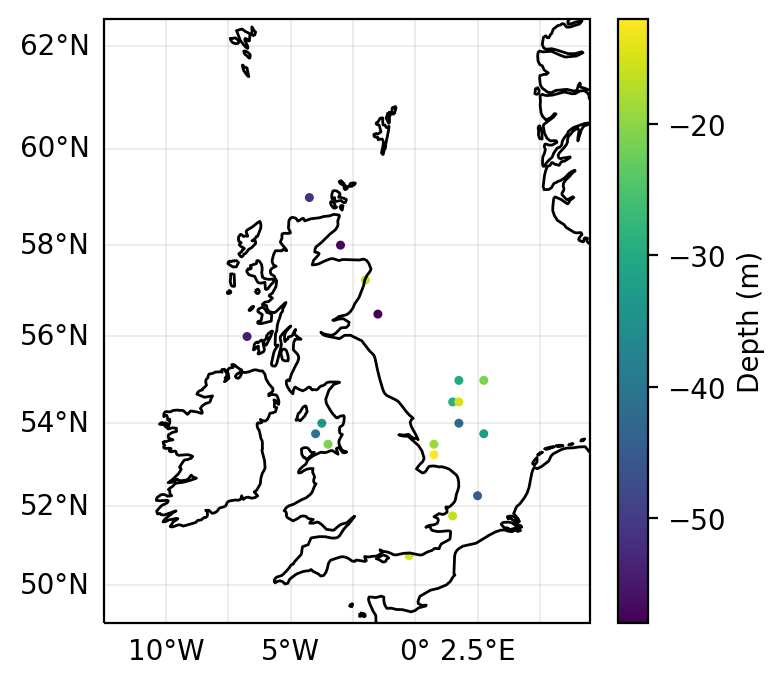

In [157]:
spec_farm_lats = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Latitude"]
spec_farm_lons = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Longitude"]
spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)
lats_init = xr.DataArray(spec_farm_lats, dims='coords')
lons_init = xr.DataArray(spec_farm_lons, dims='coords') 
farm_depths = ds_depth.sel(lat = lats_init, lon = lons_init,method="nearest", tolerance=0.1)
depth_color = farm_depths.to_array().to_numpy()[0]


#plotting
edge =-0.05
fig, ax = plt.subplots(1, 1, subplot_kw=dict(projection=ccrs.Mercator()), dpi=200)
ax = plt.axes(projection=ccrs.Mercator())
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.1, color='black', alpha=0.5 )
gl.top_labels = False
gl.right_labels = False
plt.title('Wind Farm Locations')
plt.title('')
ax.set_extent([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0], ds.coords['latitude'][-1]], ccrs.PlateCarree())
ax.coastlines(resolution='50m')

img_extent = ([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0]-edge, ds.coords['latitude'][-1]+edge])
sc = plt.scatter(x=spec_farm_lons, y=spec_farm_lats,marker='.', s=20,transform=ccrs.PlateCarree(),linewidth=1,c=depth_color) 


plt.colorbar(sc, label='Depth (m)',pad=0.03)
plt.savefig('./figures/specific_wind_farm_locations.pdf',bbox_inches='tight')

## Initialising Genetic Algorithm

In [33]:
fitness_function = fitness_func_spec

num_generations = 10
num_parents_mating = 2

sol_per_pop = 5 #num different groups that can be chosen (# chromosomes)
num_genes = 10 #num of farms per group (# genes per chromosome)

#create gene_space
gene_space=np.arange(0,open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Latitude"].shape[0],dtype='int')

parent_selection_type = "rank"
keep_parents = 1

crossover_type = "single_point"

mutation_type = "adaptive"
mutation_percent_genes = [30,10]

def callback_gen(ga_instance):
    print("Generation : ", ga_instance.generations_completed)
    print("Fitness of the best solution :", ga_instance.best_solution()[1])

last_fitness = 0
start_step = time.time()
def on_generation(ga_instance):
    global last_fitness
    global start_step
    print("Generation = {generation}".format(generation=ga_instance.generations_completed))
    print("Fitness    = {fitness}".format(fitness=ga_instance.best_solution(pop_fitness=ga_instance.last_generation_fitness)[1]))
    print("Change     = {change}".format(change=ga_instance.best_solution(pop_fitness=ga_instance.last_generation_fitness)[1] - last_fitness))
    end = time.time()
    print('Time taken:',np.round(end-start_step,decimals=3),'secs \n')
    last_fitness = ga_instance.best_solution(pop_fitness=ga_instance.last_generation_fitness)[1]
    start_step = time.time()

In [34]:
ga_instance = pygad.GA(num_generations=num_generations,
                       gene_space = gene_space,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       mutation_type=mutation_type,
                       mutation_percent_genes=mutation_percent_genes,
                       on_generation=on_generation,
                       parallel_processing=["process",sol_per_pop])
                       

## Running Trial PyGAD



In [35]:
start = time.time()
ga_instance.run()
end = time.time()
print('Time taken:',np.round(end-start,decimals=3))

Firm capacity: [0.754064   0.66291163 0.55522283]
Avg. correlation: 0.7852883329544325
Offshore loss: 0.9944279534725621
Capacity factor: 0.5331546296296297
Depth factor: 0.783888888888889
Fitness: 0.0586632366620203
Firm capacity: [0.71639478 0.62789946 0.53899536]
Avg. correlation: 0.844462787811977
Offshore loss: 0.9923687234123906
Capacity factor: 0.524752
Depth factor: 0.8488888888888889
Fitness: 0.043162658337041276
Firm capacity: [0.7199692  0.61787018 0.52125162]
Avg. correlation: 0.8009605300835767Firm capacity:
Offshore loss:  0.9963728815288465
[0.74814625 0.64840957 0.5441621 ]Capacity factor:
 Avg. correlation:0.5109374444444444 
0.7856440879985372Depth factor:
 Offshore loss:0.8816666666666666 
0.9925350767825433Fitness:
 Capacity factor:0.05536211216730703 
0.5296874814814815
Depth factor: 0.82
Fitness: 0.059780019701292736
Firm capacity: [0.74877842 0.63619857 0.527369  ]
Avg. correlation: 0.7756121976533217
Offshore loss: 0.9949415219710632
Capacity factor: 0.522300814

Firm capacity: [0.82160716 0.71338125 0.58205947]
Avg. correlation: 0.7154654515705955
Offshore loss: 0.9946680112521957
Capacity factor: 0.5469686296296297
Depth factor: 0.7944444444444445
Fitness: 0.08678577242292947
Firm capacity: [0.78585349 0.66684729 0.5523709 ]
Avg. correlation: 0.7440538512808085
Offshore loss: 0.9944216295551013
Capacity factor: 0.5345765185185185
Depth factor: 0.8283333333333334
Fitness: 0.07532563918000995
Firm capacity: [0.79709484 0.67823123 0.55941516]
Avg. correlation: 0.7354125339203537
Offshore loss: 0.9922886950854487
Firm capacity:Capacity factor:  0.5408264444444445
[0.77007757 0.6650173  0.56554681]Depth factor:
 Avg. correlation:0.816111111111111 
Fitness:0.7681750835515414 
0.07859636338529873Offshore loss:
 0.99626711442182
Capacity factor: 0.5443879259259259
Depth factor: 0.7811111111111112
Fitness: 0.06549456550253775
Generation = 9
Fitness    = 0.08678577242292947
Change     = 0.0004664678619018675
Time taken: 2.007 secs 

Firm capacity: [0.8

Firm capacity: [0.81269013 0.69857023 0.5741834 ]
Avg. correlation: 0.7314691284980982
Offshore loss: 0.992871618207343
Capacity factor: 0.5451699629629629
Depth factor: 0.8011111111111111
Fitness: 0.080944849551154
Firm capacity: [0.79159537 0.67881113 0.55816507]
Avg. correlation: 0.738709919416435
Offshore loss: 0.9909522703983057
Capacity factor: 0.5395111111111112
Depth factor: 0.8150000000000001
Fitness: 0.0769844020016681
Firm capacity:Firm capacity:  [0.81428721 0.70626569 0.58484486]
[0.80522758 0.68848867 0.55602137]Avg. correlation:
 Avg. correlation:0.7297857618304744
 Offshore loss:0.7170812108444133 
0.9926794673526027
Offshore loss:Capacity factor:  0.99466801125219570.5534822962962963

Depth factor:Capacity factor:  0.7922222222222222
0.5338962592592592Fitness:
 Depth factor:0.08254312792823285 
0.8138888888888889
Fitness: 0.0835485577494558
Parameters of the best solution : [16. 17. 18. 10.  7. 13.  2.  7. 18.  5.]
Fitness value of the best solution = 0.083548557749455

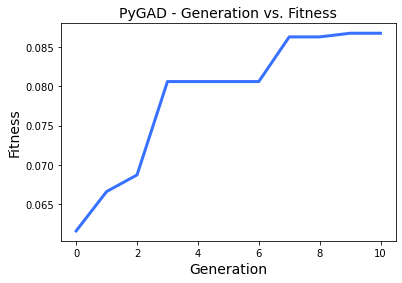

Figure(432x288)


In [36]:
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print("Parameters of the best solution : {solution}".format(solution=solution))
print("Fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))
print(ga_instance.plot_fitness())

# LOAD SOLUTIONS
### Plotting Locations

In [156]:
#loading locations
farm_locations = dict()
coord_sol = dict()
coord_idx = dict()

# sets locations of original wind farms
spec_farm_lats = np.array([53.88,53.50,52.23,54.08,58.10,51.64,53.27, 50.66,53.45,50.66,57.21])
spec_farm_lons = np.array([1.79,0.80,2.48,-3.73,-3.09,1.55,0.84,-0.26,-3.58,-0.26,-1.98])
spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)


#opens up all wind farm locations from csv file
spec_farm_lats = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Latitude"]
spec_farm_lons = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Longitude"]
spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)

#number of solutions algorithm found
num_solutions = 100
    
for i in range(num_solutions):
    coord_idx[i] = np.loadtxt(f'./data/farm_locations/locs_specd_final{i}')
    coord_idx[i] = coord_idx[i].astype('int')
    lats = spec_farm_lats[coord_idx[i]]
    lons = spec_farm_lons[coord_idx[i]]
    coord_sol[i] = np.hstack((lats,lons))

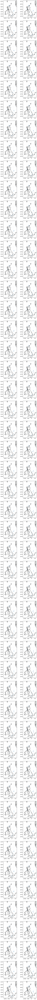

In [84]:
num_farms = int(coord_sol[0].shape[0]/2)
edge =-0.05

#plotting



fig, ax = plt.subplots(int(num_solutions/2), 2, subplot_kw=dict(projection=ccrs.Mercator()), dpi=200, figsize=(7,num_solutions*2))
plt.title('Wind Farm Locations')
plt.title('')
img_extent = ([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0]-edge, ds.coords['latitude'][-1]+edge])

for i in range(num_solutions):
    
    #calculating weights
    combos = list(zip(coord_sol[i][num_farms:], coord_sol[i][:num_farms]))
    weight_counter = Counter(combos)
    weights = [weight_counter[(coord_sol[i][num_farms:][j], coord_sol[i][:num_farms][j])] for j, _ in enumerate(coord_sol[i][num_farms:])]
    
    #plotting
    column = i%2
    row = int((i-column)/2)
    ax[row,column] = plt.axes(ax[row,column],projection=ccrs.Mercator())
    gl = ax[row,column].gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.1, color='black', alpha=0.5 )
    gl.top_labels = False
    gl.right_labels = False
    ax[row,column].set_extent([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0], ds.coords['latitude'][-1]], ccrs.PlateCarree())
    ax[row,column].coastlines(resolution='50m')
    ax[row,column].scatter(x=coord_sol[i][num_farms:], y=coord_sol[i][:num_farms],marker='x', s=np.array(weights)*6,transform=ccrs.PlateCarree(),linewidth=1)#fitness_arr) 
    divider = make_axes_locatable(ax[row,column])

## Creating code to assess the correlation between each outcome of the 100 solutions

This is a measure of the degeneracy of the solutions created by the GA. With a higher correlation coefficient there is a stronger link between the weights outputted by the algorithm and therefore points towards the finding of a more global minima.

In [85]:
def locs_output_corr(num_sols, coord_sol):
    """Calculates the average pairwise correlations between weightings outputted by the genetic algorithm.
    Inputs
    num_outputs: number of GA solutions
    coord_sol: array holding coordinates of solutions
    """
    
    #opens up wind farm locations
    spec_farm_lats = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Latitude"]
    spec_farm_lons = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Longitude"]
    spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
    spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)
    all_coords = np.hstack((spec_farm_lats,spec_farm_lons))
    
    num_ind_farms = int(all_coords.shape[0]/2)
    occurences = dict()
    
    #creates a base of zero count labels
    test_list1 = [str(x) for x in all_coords[:num_ind_farms]]  
    test_list2 = [str(x) for x in all_coords[num_ind_farms:]] 
    all_coords_list = [i + j for i, j in zip(test_list1, test_list2)] #creates list of all labels
    base = dict()
    for label in all_coords_list:
        base[label] = 0
    base = Counter(base)
    
    num_farms = int(coord_sol[0].shape[0]/2)
    #loops over weighting sols - find # of occurences in each
    for k in range(num_sols):
        test_list1 = [str(x) for x in coord_sol[k][:num_farms]]  
        test_list2 = [str(x) for x in coord_sol[k][num_farms:]] 
        res = [i + j for i, j in zip(test_list1, test_list2)] #creates list of all labels
        counter = collections.Counter(res)
        counter.update(base)
        occurences[k] = np.array([counter[x] for x in sorted(counter.keys())])
    
    #finds avg pairwise correlation of # of occurences between solutions
    combinations = int(num_sols*(num_sols-1)/2) #number of pairwise combinations
    val=0
    for i in range(num_sols):
        for j in range(i):
            val += scipy.stats.spearmanr(occurences[i],occurences[j]).correlation
    avg_corr = val/combinations
    
    return avg_corr

avg_corr = np.round(locs_output_corr(100,coord_sol),decimals=3)
print('Average Correlation between solution weightings:',avg_corr)

Average Correlation between solution weightings: 0.813


## Code to Find the average weighting of each location

In [86]:
def sol_weighting(num_sols, coord_sol):
    """Creates an array of the weightings of the wind farms solutions for each location.
    Inputs
    num_outputs: number of GA solutions
    coord_sol: array holding coordinates of solutions
    """
    
    #opens up wind farm locations
    spec_farm_lats = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Latitude"]
    spec_farm_lons = open_wind_farm_csv('./data/Wind_Farm_Locations.csv')["Longitude"]
    spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
    spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)
    all_coords = np.hstack((spec_farm_lats,spec_farm_lons))
    
    num_ind_farms = int(all_coords.shape[0]/2)
    occurences = dict()
    
    #creates a base of zero count labels
    test_list1 = [str(x) for x in all_coords[:num_ind_farms]]  
    test_list2 = [str(x) for x in all_coords[num_ind_farms:]] 
    all_coords_list = [i + j for i, j in zip(test_list1, test_list2)] #creates list of all labels
    base = dict()
    for label in all_coords_list:
        base[label] = 0
    base = Counter(base)
    
    weightings =np.zeros((num_sols,num_ind_farms)) #array to store weights of each solution
    num_farms = int(coord_sol[0].shape[0]/2)
    #loops over weighting sols - find # of occurences in each
    for k in range(num_sols):
        test_list1 = [str(x) for x in coord_sol[k][:num_farms]]  
        test_list2 = [str(x) for x in coord_sol[k][num_farms:]] 
        res = [i + j for i, j in zip(test_list1, test_list2)] #creates list of all labels
        counter = collections.Counter(res)
        counter.update(base)
        occurences[k] = np.array([counter[x] for x in sorted(counter.keys())])
        weightings[k] = np.array([counter[x] for x in sorted(counter.keys())])
    
    
    return weightings


def sort_locations(file_name):
    """Sorts locations of wind farms into ascending order by latitude and then longitude.
    Accepts a file address for input."""

    spec_farm_lats = open_wind_farm_csv(file_name)["Latitude"]
    spec_farm_lons = open_wind_farm_csv(file_name)["Longitude"]
    spec_farm_lats = (np.round(spec_farm_lats*4, decimals=0)/4)
    spec_farm_lons = (np.round(spec_farm_lons*4, decimals=0)/4)

    coord_arr = np.vstack((spec_farm_lats,spec_farm_lons))
    i = np.argsort(coord_arr[1,:])
    a = coord_arr[:,i]
    i = np.argsort(coord_arr[0,:])
    a = coord_arr[:,i]
    
    return a

# Plotting the weight averages

In [87]:
weights = sol_weighting(100,coord_sol)

weights = weights/(30*0.01) #normalising weights for 100 wind farms allocated

locs = sort_locations('./data/Wind_Farm_Locations.csv')

avg_weights = np.mean(weights,axis=0)
std_dev_weights = np.std(weights,axis=0)
rms_weights = np.sqrt(np.mean((weights-avg_weights)**2,axis=0))
rms_norm_weights = rms_weights/avg_weights

/tmp/ipykernel_73587/4240616209.py:10: RuntimeWarning: invalid value encountered in true_divide
  rms_norm_weights = rms_weights/avg_weights


## RMSD Plot

In [96]:
import matplotlib.colors as colors

[[-0.25        1.5         2.5         0.75        0.75       -3.5       ]
 [50.75       51.75       52.25       53.25       53.5        53.5       ]
 [24.1         5.9         0.43333333  0.93333333  0.          0.13333333]
 [ 2.15277599  2.74286954  1.12101145  1.56914697  0.          0.65319726]
 [ 0.0893268   0.46489314  2.5869495   1.6812289          nan  4.89897949]]
2.74286954362276


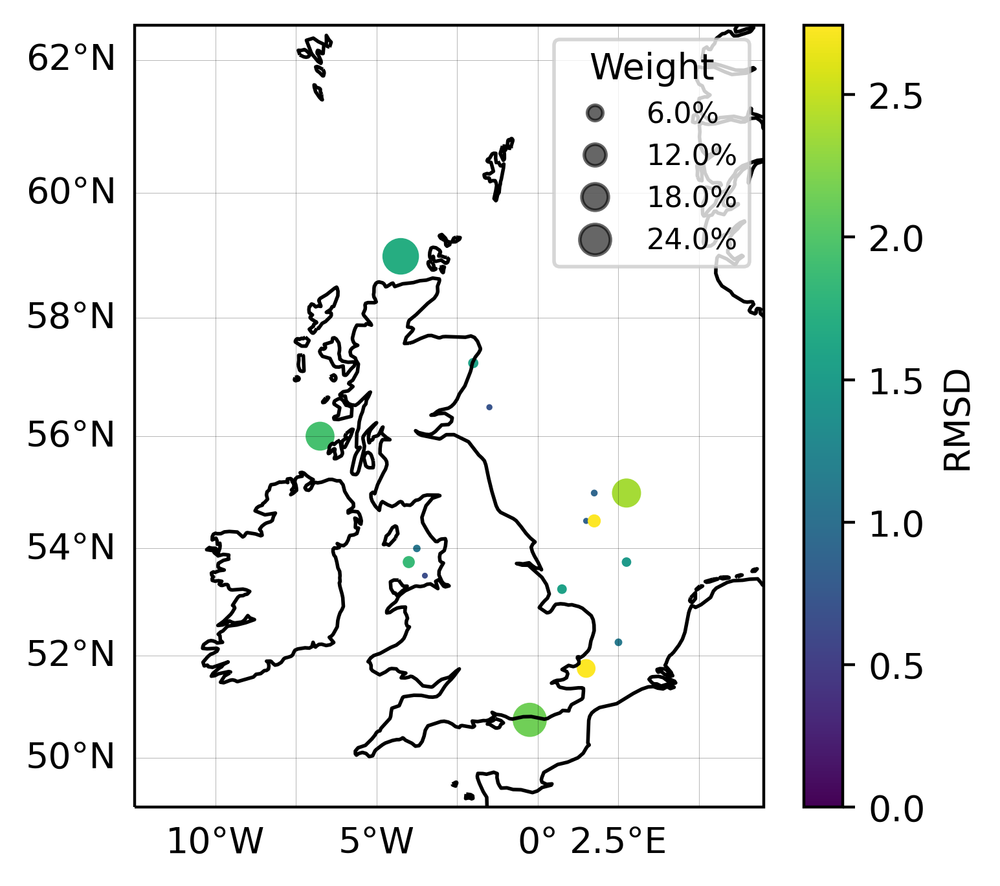

In [102]:
#plotting
edge =-0.05
fig, ax = plt.subplots(1, 1, subplot_kw=dict(projection=ccrs.Mercator()), dpi=400, figsize=(4,4))
ax = plt.axes(projection=ccrs.Mercator())
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.1, color='black', alpha=0.5 )
gl.top_labels = False
gl.right_labels = False
plt.title('Wind Farm Locations')
plt.title('')
ax.set_extent([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0], ds.coords['latitude'][-1]], ccrs.PlateCarree())
ax.coastlines(resolution='50m')


scales = rms_norm_weights
cmap = plt.get_cmap("Spectral")
norm = plt.Normalize(scales.min(), scales.max())

marker_scl_fctr = 3
img_extent = ([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0]-edge, ds.coords['latitude'][-1]+edge])
sc = plt.scatter(x=locs[1,:], y=locs[0,:], s=avg_weights*marker_scl_fctr,transform=ccrs.PlateCarree(),linewidth=1,c=rms_weights) 

plt.colorbar(sc, label='RMSD')
#divider = make_axes_locatable(ax)



#handles, labels = sc.legend_elements(prop="sizes", alpha=0.6, num=6)     
#labels = ["< 5000", "< 20000", " <50000", "> 50000"]     
#legend = ax.legend(handles, labels, loc="upper right", title="Resource weight")

kw = dict(prop="sizes", num=5, alpha=0.6, fmt="{x:.1f}%",
          func=lambda s: s/marker_scl_fctr,)
legend = ax.legend(*sc.legend_elements(**kw),
                    loc="upper right", title="Weight", fontsize=8)

plt.savefig('./figures/rms_avg_solution_weights.pdf',bbox_inches='tight')

spreadsheet = np.vstack((locs[1,:],locs[0,:],avg_weights,rms_weights,rms_norm_weights))
np.savetxt("./data/solutions_spreadsheet.csv", spreadsheet, delimiter=",")
n = 0
print(spreadsheet[:,n:n+6])
print(np.max(rms_weights))


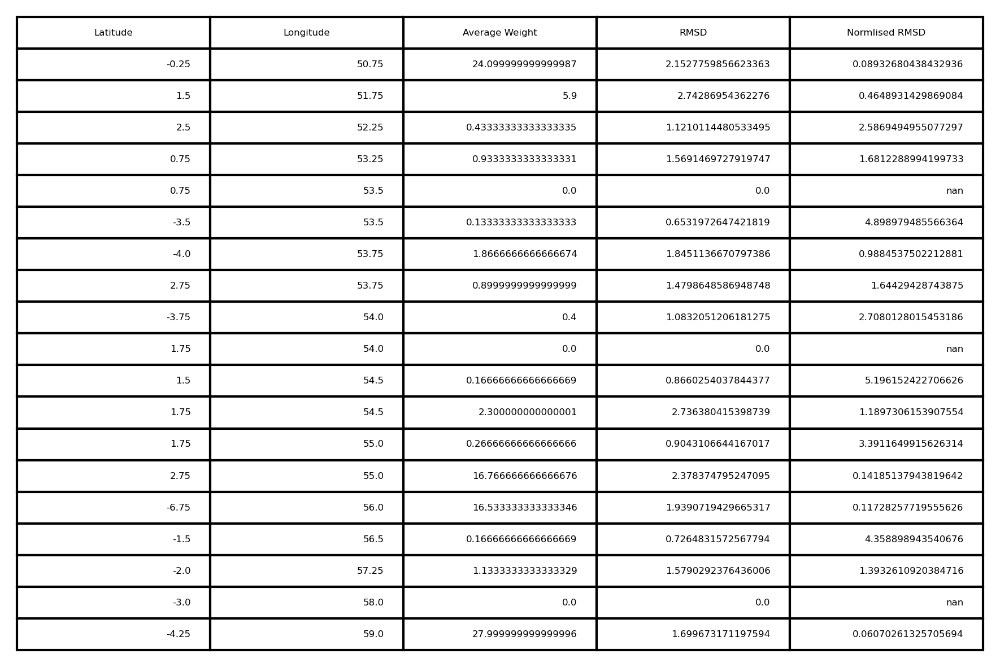

In [89]:
fig, ax = plt.subplots(dpi=300)

# hide axes
fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')

df = pd.DataFrame(spreadsheet.transpose(), columns=list(['Latitude','Longitude','Average Weight','RMSD','Normlised RMSD']))

ax.table(cellText=df.values, colLabels=df.columns, loc='center')

fig.tight_layout()

plt.show()

## Normalised  RMSD Plot

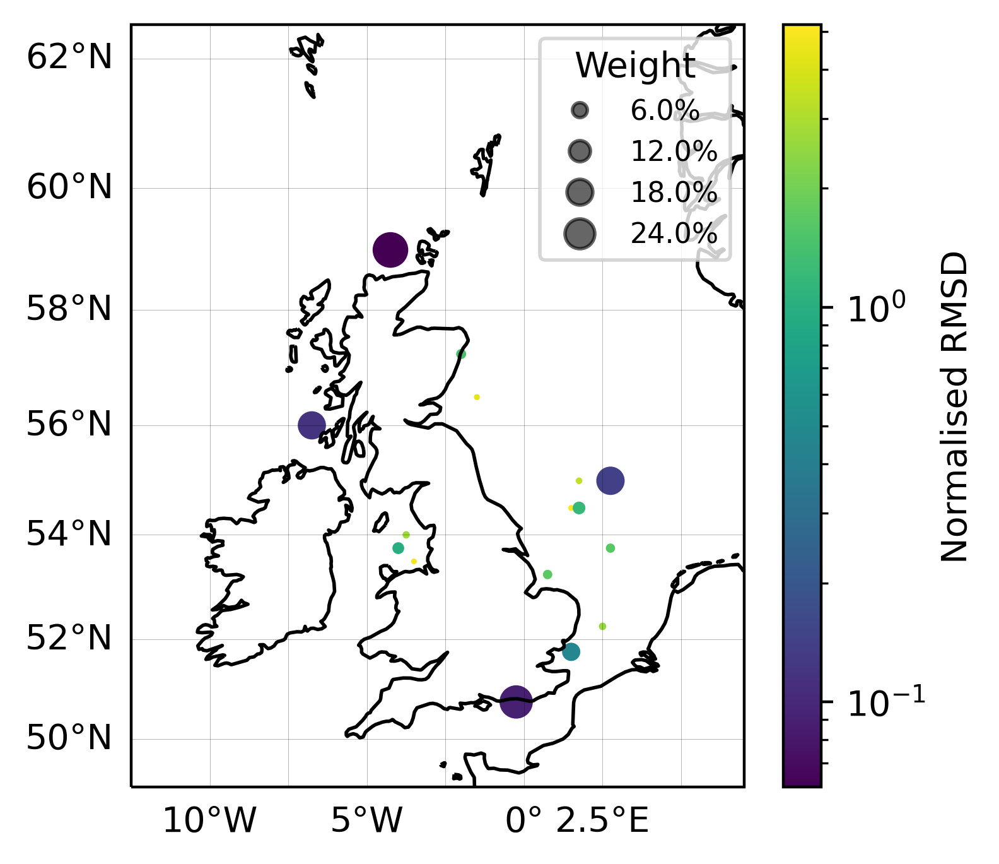

In [103]:
#plotting
edge =-0.05
fig, ax = plt.subplots(1, 1, subplot_kw=dict(projection=ccrs.Mercator()), dpi=400, figsize=(4,4))
ax = plt.axes(projection=ccrs.Mercator())
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.1, color='black', alpha=0.5 )
gl.top_labels = False
gl.right_labels = False
plt.title('Wind Farm Locations')
plt.title('')
ax.set_extent([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0], ds.coords['latitude'][-1]], ccrs.PlateCarree())
ax.coastlines(resolution='50m')


scales = rms_norm_weights
cmap = plt.get_cmap("Spectral")
norm = plt.Normalize(scales.min(), scales.max())

marker_scl_fctr = 3
img_extent = ([ds.coords['longitude'][0], ds.coords['longitude'][-1],ds.coords['latitude'][0]-edge, ds.coords['latitude'][-1]+edge])
sc = plt.scatter(x=locs[1,:], y=locs[0,:], s=avg_weights*marker_scl_fctr,transform=ccrs.PlateCarree(),linewidth=1,c=rms_norm_weights,norm=colors.LogNorm()) 

plt.colorbar(sc, label='Normalised RMSD')
#divider = make_axes_locatable(ax)



#handles, labels = sc.legend_elements(prop="sizes", alpha=0.6, num=6)     
#labels = ["< 5000", "< 20000", " <50000", "> 50000"]     
#legend = ax.legend(handles, labels, loc="upper right", title="Resource weight")

kw = dict(prop="sizes", num=5, alpha=0.6, fmt="{x:.1f}%",
          func=lambda s: s/marker_scl_fctr,)
legend = ax.legend(*sc.legend_elements(**kw),
                    loc="upper right", title="Weight", fontsize=8)

plt.savefig('./figures/norm_rms_avg_solution_weights.pdf',bbox_inches='tight')

## Characterising Weights

In [115]:
weights = sol_weighting(100,coord_sol)

weights = weights/(30*0.01) #normalising weights for 100 wind farms allocated

locs = sort_locations('./data/Wind_Farm_Locations.csv')

avg_weights = np.mean(weights,axis=0)
std_dev_weights = np.std(weights,axis=0)
rms_weights = np.sqrt(np.mean(weights**2,axis=0))
rms_norm_weights = rms_weights/avg_weights
avg_solution = np.round(avg_weights, decimals=0)

/tmp/ipykernel_73587/2420741966.py:10: RuntimeWarning: invalid value encountered in true_divide
  rms_norm_weights = rms_weights/avg_weights


In [116]:
def perc_finder(proportion, lat1=50,lat2=60,lon1=-10,lon2=5,weights=weights):
    """Finds the percentage of solutions that assign at least a specified proportion of resources in a certain 
    region."""
    
    loc_weights = weights[:,(locs[0,:] > lat1) & (locs[0,:] < lat2) & (locs[1,:] > lon1) & (locs[1,:] < lon2)]
    num = loc_weights.shape[1]
    loc_weights_sum_norm = np.sum(loc_weights,axis =1)
    
    percentage = np.sum(loc_weights_sum_norm >= proportion)
    
    return percentage

num_graphs = 4

99 % of solutions place at least 26 % of wind power West of Orkney


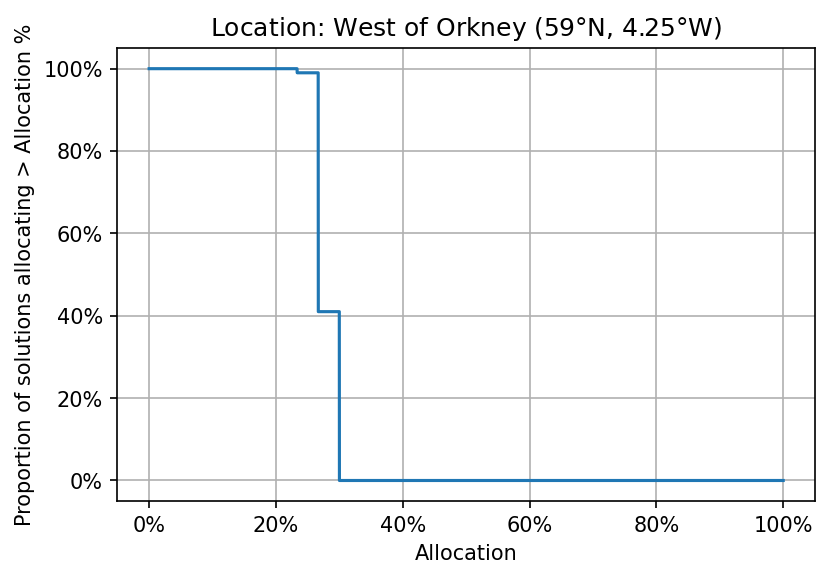

In [53]:
proportion = 26
lat1 = 58
orkney_perc = perc_finder(proportion, lat1 = lat1)
print(orkney_perc,'% of solutions place at least',proportion,'% of wind power West of Orkney')

ratios = np.linspace(0,1.0,10000)*100
percs = np.zeros((num_graphs,ratios.shape[0]))
for i in range(ratios.shape[0]):
    percs[0,i] = perc_finder(ratios[i], lat1 = lat1)

plt.figure(dpi=150)
plt.plot(ratios,percs[0,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title(f'Location: West of Orkney (59$\degree$N, 4.25$\degree$W)')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/West_Orkney_weights.pdf',bbox_inches='tight')

89 % of solutions place at least 23 % of wind power st Rampion, (Brighton)


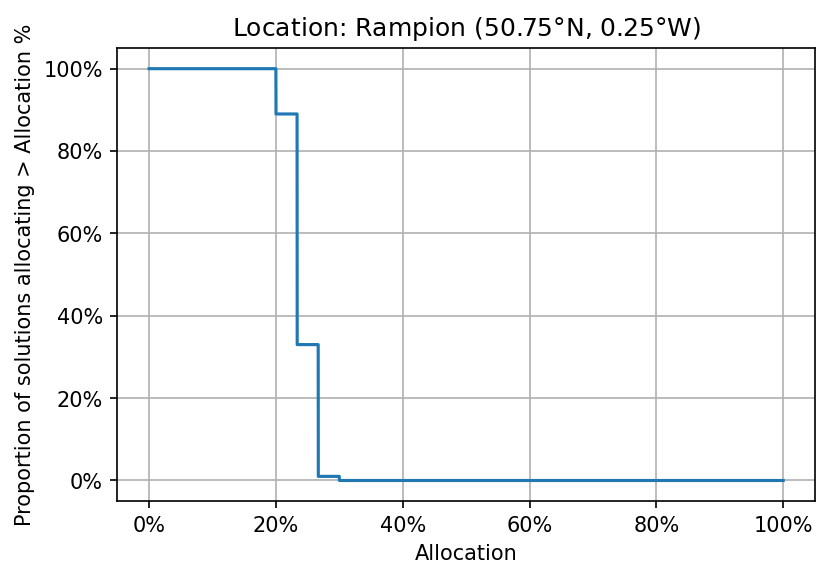

In [54]:
proportion = 23
lat2 = 51
perc = perc_finder(proportion, lat2 = lat2)
print(perc,'% of solutions place at least',proportion,'% of wind power st Rampion, (Brighton)')


for i in range(ratios.shape[0]):
    percs[1,i] = perc_finder(ratios[i], lat2 = lat2)
    
    
plt.figure(dpi=150)
plt.plot(ratios,percs[1,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title('Location: Rampion (50.75$\degree$N, 0.25$\degree$W)')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/Rampion_weights.pdf',bbox_inches='tight')

82 % of solutions place at least 16 % of wind power on Dogger Bank


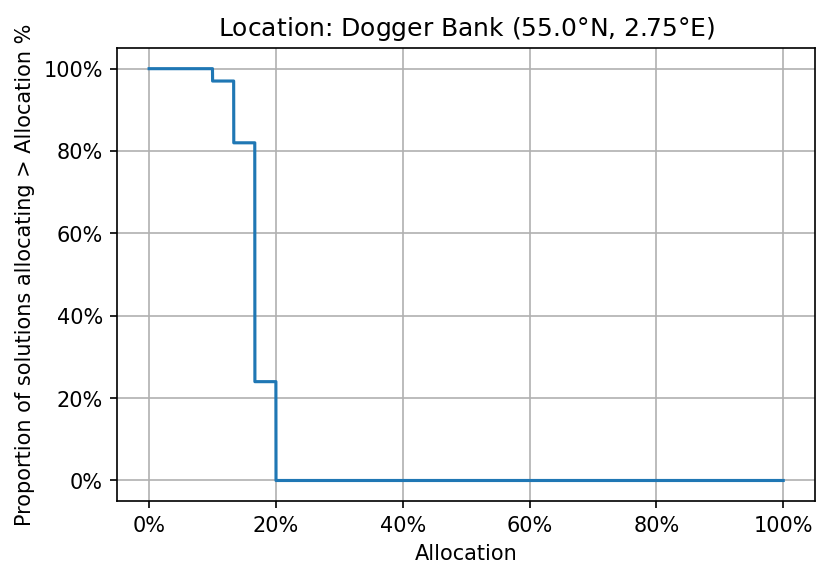

In [111]:
lat1 = 54.95
lon1 = 2.6

proportion = 16
perc = perc_finder(proportion, lat1 = lat1, lon1 = lon1)
print(perc,'% of solutions place at least',proportion,'% of wind power on Dogger Bank')


for i in range(ratios.shape[0]):
    percs[2,i] = perc_finder(ratios[i], lat1 = lat1, lon1 = lon1)
    

    
    
plt.figure(dpi=150)
plt.plot(ratios,percs[2,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title('Location: Dogger Bank (55.0$\degree$N, 2.75$\degree$E)')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/Dogger_bank_weights.pdf',bbox_inches='tight')

0 % of solutions place at least 30 % of wind power at Machair


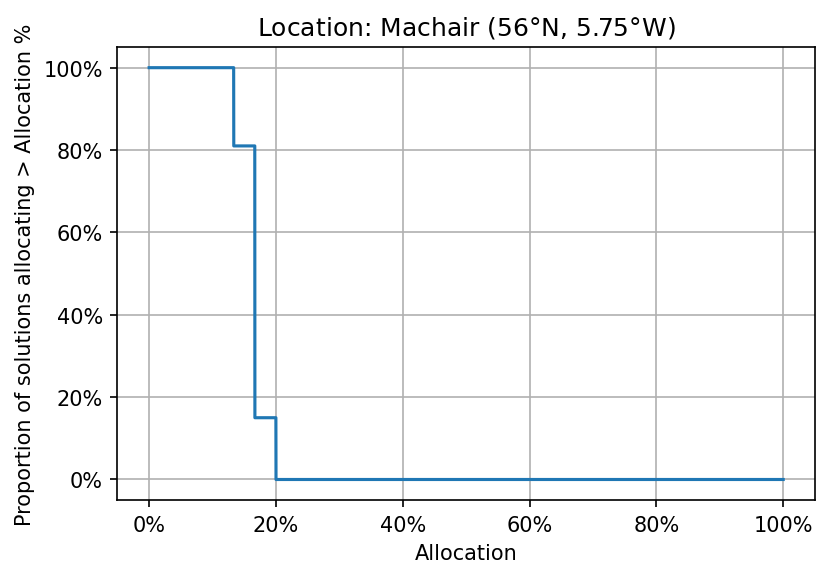

In [60]:
proportion = 30
lat1 = 55.75
lat2 = 56.25
lon2 = -6.5
machair_perc = perc_finder(proportion, lat1 = lat1,lat2=lat2, lon2=lon2)
print(machair_perc,'% of solutions place at least',proportion,'% of wind power at Machair')


for i in range(ratios.shape[0]):
    percs[3,i] = perc_finder(ratios[i], lat1 = lat1,lat2=lat2, lon2=lon2)

    
    
plt.figure(dpi=150)
plt.plot(ratios,percs[3,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title(f'Location: Machair (56$\degree$N, 5.75$\degree$W)')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/Machair_weights.pdf',bbox_inches='tight')

In [61]:
i = 2
i%2

0

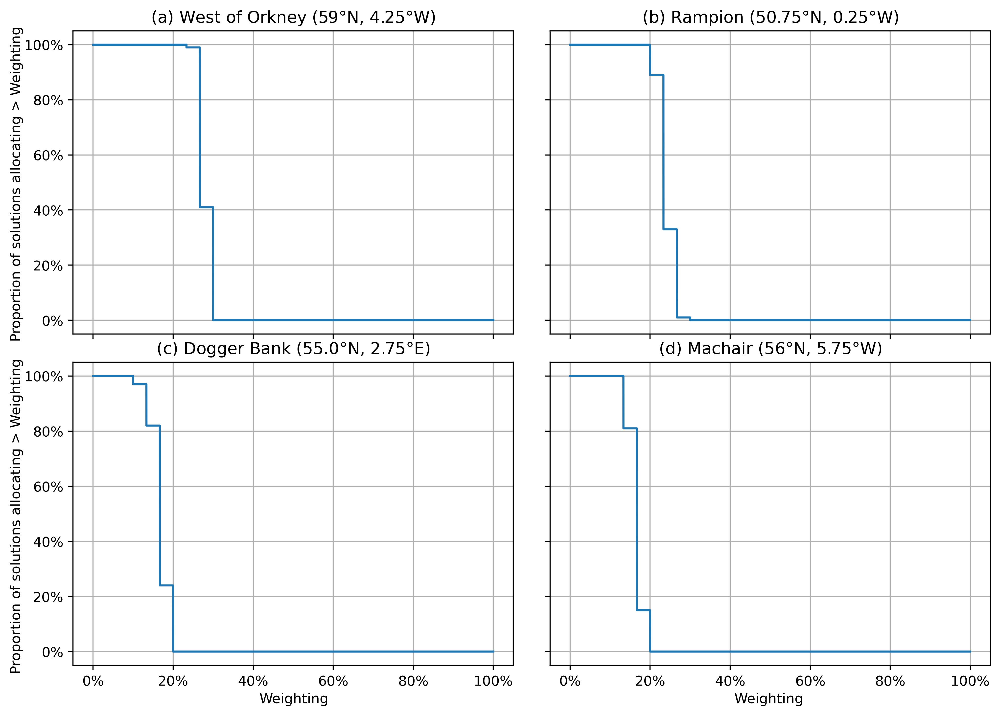

In [65]:
titles = [f'(a) West of Orkney (59$\degree$N, 4.25$\degree$W)','(b) Rampion (50.75$\degree$N, 0.25$\degree$W)','(c) Dogger Bank (55.0$\degree$N, 2.75$\degree$E)',f'(d) Machair (56$\degree$N, 5.75$\degree$W)']

# plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
# plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))

fig, axes = plt.subplots(2,2,dpi=400,figsize=(10,7),sharey=True,sharex=True)
fig.tight_layout()

for i, ax in enumerate(axes.flatten()[:20]):
    ax.plot(ratios,percs[i,:])
    ax.set_title(titles[i])
    ax.grid()
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.xaxis.set_major_formatter(mtick.PercentFormatter())
    
fig.text(0.27, 0.0, 'Weighting', ha='center')
fig.text(0.75, 0.0, 'Weighting', ha='center')
fig.text(-0.017, 0.27, 'Proportion of solutions allocating > Weighting', va='center', rotation='vertical')
fig.text(-0.017, 0.75, 'Proportion of solutions allocating > Weighting', va='center', rotation='vertical')
plt.savefig('./figures/big_four_weight_variations.pdf',bbox_inches='tight')

# Regional Results

In [117]:
ratios = np.linspace(0,1.0,10000)*100
percs = np.zeros((num_graphs,ratios.shape[0]))

67 % of solutions place at least 3 % of wind power in the Irish Sea


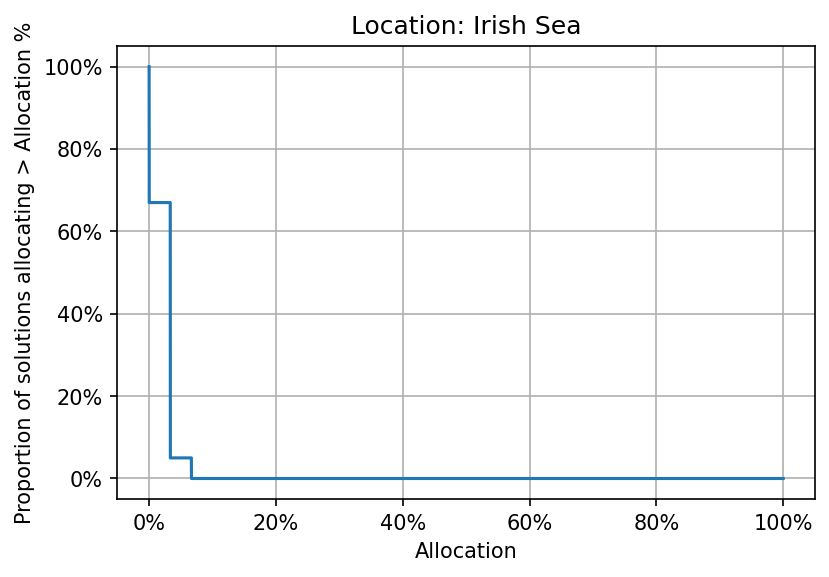

In [141]:
proportion = 3
lat2 = 55.25
lon2 = -2.5
machair_perc = perc_finder(proportion, lat2=lat2, lon2=lon2)
print(machair_perc,'% of solutions place at least',proportion,'% of wind power in the Irish Sea')


for i in range(ratios.shape[0]):
    percs[0,i] = perc_finder(ratios[i],lat2=lat2, lon2=lon2)

    
    
plt.figure(dpi=150)
plt.plot(ratios,percs[0,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title(f'Location: Irish Sea')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/irish_sea_weights.pdf',bbox_inches='tight')

100 % of solutions place at least 43 % of wind power in Scotland


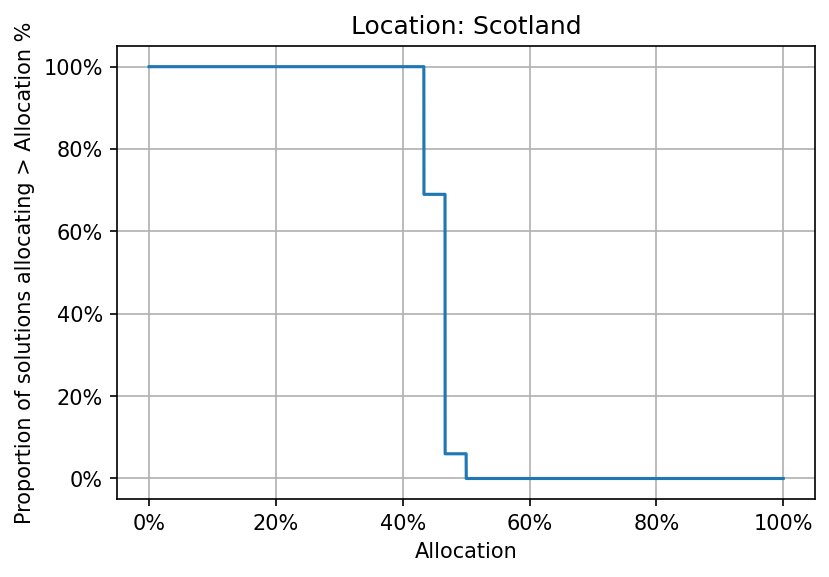

In [144]:
proportion = 43
lat1 = 55.75
scotland_perc = perc_finder(proportion, lat1 = lat1)
print(scotland_perc,'% of solutions place at least',proportion,'% of wind power in Scotland')




for i in range(ratios.shape[0]):
    percs[1,i] = perc_finder(ratios[i], lat1 = lat1)

    
    
plt.figure(dpi=150)
plt.plot(ratios,percs[1,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title(f'Location: Scotland')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/scotland_weights.pdf',bbox_inches='tight')

99 % of solutions place at least 16 % of wind power in Scotland


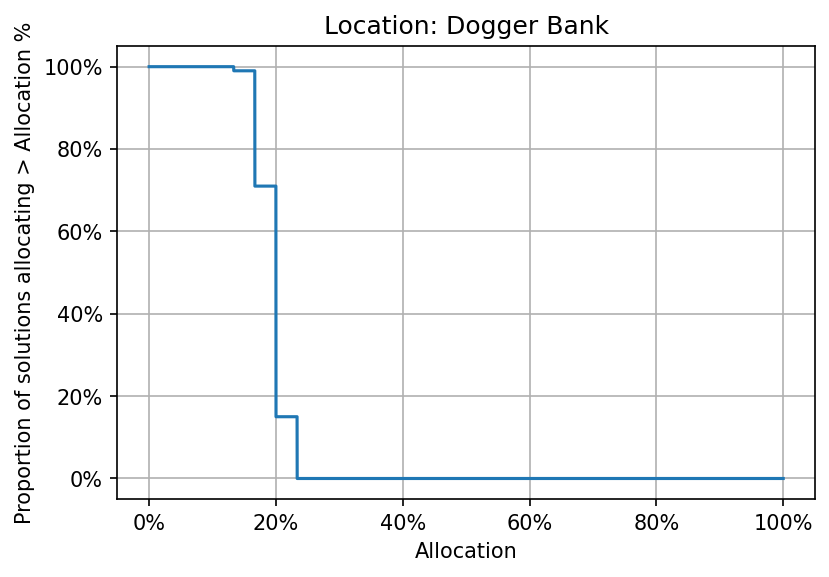

In [148]:
proportion = 16
lat1 = 54
lon1 = 0
dogger_perc = perc_finder(proportion, lat1 = lat1, lon1=lon1)
print(dogger_perc,'% of solutions place at least',proportion,'% of wind power in Scotland')




for i in range(ratios.shape[0]):
    percs[2,i] = perc_finder(ratios[i], lat1 = lat1, lon1 = lon1)

    
    
plt.figure(dpi=150)
plt.plot(ratios,percs[2,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title(f'Location: Dogger Bank')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/dogger_weights.pdf',bbox_inches='tight')

100 % of solutions place at least 26 % of wind power in South East England


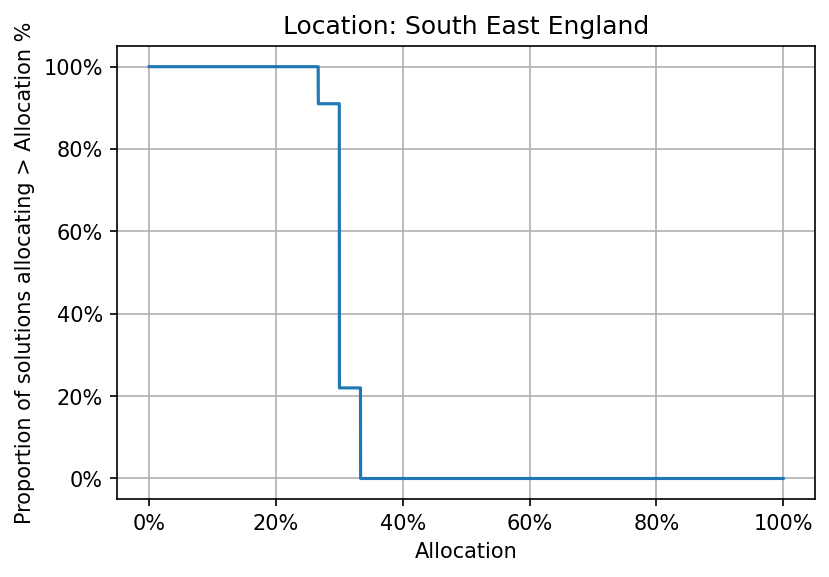

In [161]:
proportion = 26
lat2 = 53
se_perc = perc_finder(proportion, lat2 = lat2)
print(se_perc,'% of solutions place at least',proportion,'% of wind power in South East England')




for i in range(ratios.shape[0]):
    percs[3,i] = perc_finder(ratios[i], lat2 = lat2)

    
    
plt.figure(dpi=150)
plt.plot(ratios,percs[3,:])
plt.xlabel('Allocation')
plt.ylabel('Proportion of solutions allocating > Allocation %')
plt.title(f'Location: South East England')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
plt.grid()
plt.savefig('./figures/south_east_weights.pdf',bbox_inches='tight')

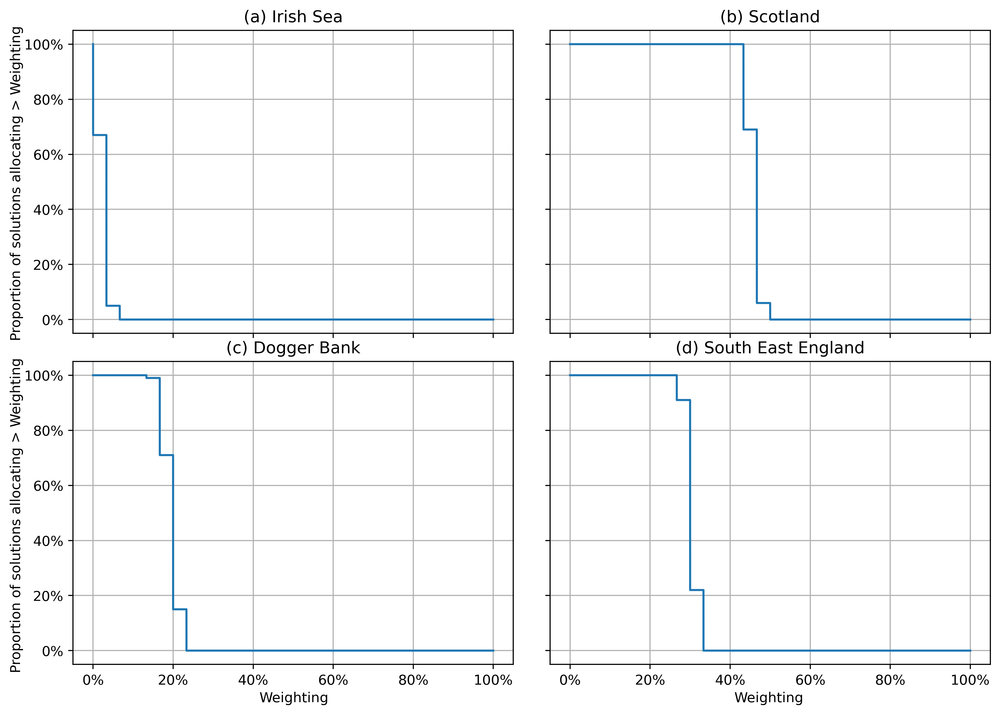

In [136]:
titles = [f'(a) Irish Sea','(b) Scotland','(c) Dogger Bank',f'(d) South East England']

# plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))
# plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=100))

fig, axes = plt.subplots(2,2,dpi=400,figsize=(10,7),sharey=True,sharex=True)
fig.tight_layout()

for i, ax in enumerate(axes.flatten()[:20]):
    ax.plot(ratios,percs[i,:])
    ax.set_title(titles[i])
    ax.grid()
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.xaxis.set_major_formatter(mtick.PercentFormatter())
    
fig.text(0.27, 0.0, 'Weighting', ha='center')
fig.text(0.75, 0.0, 'Weighting', ha='center')
fig.text(-0.017, 0.27, 'Proportion of solutions allocating > Weighting', va='center', rotation='vertical')
fig.text(-0.017, 0.75, 'Proportion of solutions allocating > Weighting', va='center', rotation='vertical')
plt.savefig('./figures/big_four_weight_variations_regions.pdf',bbox_inches='tight')

## Plotting Aggregate Power output of Equal weighting vs Optimised Weighting

Going to get a set of solution locations in an xarray, select these and find the power output over time.

This section of code finds the average of the weights given to the wind farm locations and normalises them to a percentage value.

Calculates the average power output from the optimised and uniform set of solutions.

This does NOT use an non-uniform distribution to calculate this, instead it is perfectly uniform and the magnitude is then adjusted.

In [167]:
#number of solutions algorithm found
num_solutions = 100
#loading locations
coord_sol = dict()
coord_idx = dict()


grdpnt_power = 30*30*6
grdpnt_power = 13.5*27.5*6
turbine_rating = 8 #MW
n_turbs_grdpnt = grdpnt_power/turbine_rating
loss_factor = 0.9 #energy lost due to wind turbines in farms
    
for i in range(num_solutions):
    coord_idx[i] = np.loadtxt(f'./data/farm_locations/locs_specd_final{i}')
    coord_idx[i] = coord_idx[i].astype('int')
    lats = spec_farm_lats[coord_idx[i]]
    lons = spec_farm_lons[coord_idx[i]]
    coord_sol[i] = np.hstack((lats,lons))

weights = sol_weighting(100,coord_sol)/(30*0.01) #normalising weights for 100 wind farms allocated
locs = sort_locations('./data/Wind_Farm_Locations.csv')

#creating indexes for the uniform and optimisation coordinates
avg_weights = np.mean(weights,axis=0) #finding averages weights for each wind farm
avg_solution = np.round(avg_weights, decimals=0) #rounding weights
avg_solution_factor = 100/np.sum(avg_solution)


uniform_dist = np.ones(avg_solution.shape[0])*int(100/19)
uniform_dist_factor = 100/np.sum(uniform_dist) #multiplication factor as 19 wind farms aren't divisibile by 100

#creating coord arrays for the uniform and optimised solutions
lats_opt = np.repeat(locs[0],avg_solution.astype('int'))
lons_opt = np.repeat(locs[1],avg_solution.astype('int'))
lats_uni = np.repeat(locs[0],uniform_dist.astype('int'))
lons_uni = np.repeat(locs[1],uniform_dist.astype('int'))

lats_opt_xr = xr.DataArray(lats_opt, dims='coords')
lons_opt_xr = xr.DataArray(lons_opt, dims='coords')
lats_uni_xr = xr.DataArray(lats_uni, dims='coords')
lons_uni_xr = xr.DataArray(lons_uni, dims='coords')
lats_single_xr = xr.DataArray([53.75], dims='coords')
lons_single_xr = xr.DataArray([-4.0], dims='coords')




power_opt = ds['power'].sel(latitude = lats_opt_xr, longitude = lons_opt_xr)
agg_power_opt = (power_opt*n_turbs_grdpnt*loss_factor*avg_solution_factor).sum(dim='coords')

power_uni = ds['power'].sel(latitude = lats_uni_xr, longitude = lons_uni_xr)
agg_power_uni = (power_uni*n_turbs_grdpnt*loss_factor*uniform_dist_factor).sum(dim='coords')

power_single = ds['power'].sel(latitude = lats_single_xr, longitude = lons_single_xr)
agg_power_single = (power_single*n_turbs_grdpnt*loss_factor*100).sum(dim='coords')


scale_factor = 0.5
print('Optimised avg power output:',agg_power_opt.mean().values*1e-6*scale_factor,'GW')
print('Capacity factor:',(agg_power_opt.mean().values*1e-6*scale_factor)/(max_power*1e5*1e-9*scale_factor))
print('\nUniform avg power output:',agg_power_uni.mean().values*1e-6*scale_factor,'GW')
print('Capacity factor:',(agg_power_uni.mean().values*1e-6*scale_factor)/(max_power*1e5*1e-9*scale_factor))
print('\nSingle avg power output:',agg_power_single.mean().values*1e-6*scale_factor,'GW')
print('Capacity factor:',(agg_power_single.mean().values*1e-6*scale_factor)/(max_power*1e5*1e-9*scale_factor))


#number of farms used in model 
num_farms = 1
max_power = 8*1000*1*n_turbs_grdpnt*num_farms
print('\nMax Power per wind farm group:',max_power*1e5*1e-9*scale_factor,'GW')

Optimised avg power output: 60.5976 GW
Capacity factor: 0.5440861952861953

Uniform avg power output: 59.502064 GW
Capacity factor: 0.5342497328843995

Single avg power output: 60.84206 GW
Capacity factor: 0.5462811223344556

Max Power per wind farm group: 111.375 GW


## Log Comparison Plot of Wind Speeds

/home/xzcaphbe/.conda/envs/env3.8_optimise/lib/python3.8/site-packages/xarray/core/computation.py:733: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)


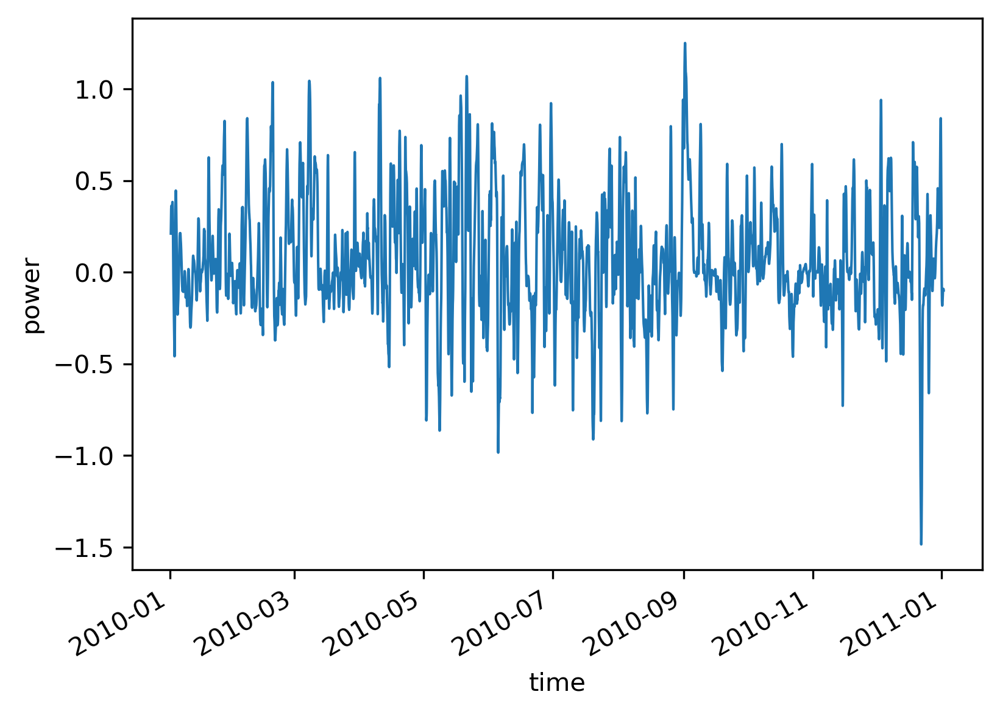

In [134]:
diff_power = agg_power_opt - agg_power_uni
log_comparison = np.log(agg_power_opt/agg_power_uni)

fig = plt.figure(dpi=300)
#diff_power.sel(time=slice('2010-01-01', '2011-01-01')).rolling(time=12).mean().plot(linewidth=1)
log_comparison.sel(time=slice('2010-01-01', '2011-01-01')).rolling(time=12).mean().plot(linewidth=1)
fig.savefig('./figures/final_log_plot_comp.pdf',bbox_inches='tight')

## Sample Fitnesses

A set of distributions of 30 wind farms around the U.K.

uses:
- one of the optimised solutions
- one semi-uniform distribtuion
- one distribution of farms at a single point, i.e. dogger bank

In [135]:
#optimised example
fitness_func_spec(coord_idx[0],1)

#random selection
print()
indexes = np.round(np.random.rand(40)*18,decimals=0)
fitness_func_spec(indexes,1)

#semi-uniform
print()
uniform = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,0,1,2,3,4,5,6,7,8,9,10])
fitness_func_spec(uniform,1)

Firm capacity: [0.82907921 0.71651361 0.57957354]
Avg. correlation: 0.7297747954373396
Offshore loss: 0.9946330034074677
Capacity factor: 0.5479494201271979
Depth factor: 0.8112962962962962
Fitness: 0.0846409177000037

Firm capacity: [0.74361643 0.64368963 0.55190033]
Avg. correlation: 0.804276724348653
Offshore loss: 0.9911252212857076
Capacity factor: 0.5362113131313131
Depth factor: 0.8291666666666666
Fitness: 0.05575086275457211

Firm capacity: [0.7448285  0.64072838 0.54369154]
Avg. correlation: 0.7903873105684797
Offshore loss: 0.9934282199079556
Capacity factor: 0.5266678638234193
Depth factor: 0.8314814814814816
Fitness: 0.05864221453766471


0.05864221453766471

## Cut-off Frequency Histograms

Want to build several plots of the frequency of the number of lulls that have certain durations for a range of cut-off capacities.

Need to store the number of lulls for each of the wind farm configurations, of which both have the same maximum power and the same number of wind farms.

This model works on a power output of 100 wind farms of 222.75GW capacity, which is about 770% of current UK wind capacity. The goal for 2050 is around 100GW of offshore wind capacity in the UK, so 50 of these wind farms could be used to reach optimum capacity.

In [113]:
grdpnt_power*1e-3*100/2
grdpnt_power

2227.5

In [169]:
layouts = [agg_power_opt,agg_power_uni,agg_power_single]
#layouts = [agg_power_opt,agg_power_uni]

#avg_nums = np.logspace(0,2.5265,40, dtype='int') #1hr to 2 weeks
avg_nums = np.arange(1,337) #1hr to 2 weeks
start_date = '1998-01-01' #1998-01-01
end_date = '2021-12-31' #2021-12-31
num_yrs = 24 #years
cut_offs = np.array([0.1,0.2,0.3,0.4,0.5])
num_farms = 100
num_groups= len(layouts)
num_lulls = np.empty((cut_offs.shape[0],num_groups,avg_nums.shape[0]),dtype='float64')


#cycle through cutoffs
for k in range(cut_offs.shape[0]):
    start = time.time()
    #cycle through wind farm groups
    max_power = turbine_rating*1000*cut_offs[k]*n_turbs_grdpnt*num_farms #max power to be considered a lull
    for j, power_arr in enumerate(layouts):
    
        #cycle through avgs
        for i, num_hours in enumerate(avg_nums):
            working_ds = (power_arr.sel(time=slice(start_date, end_date))
                          .rolling(time=num_hours)
                          .mean())
            num = (working_ds.where(working_ds < max_power))
            num_next = num.where((num.shift(time=+1).isnull() != False) & (num.shift(time=-1).isnull() != False))
            num_lulls[k,j,i] = num_next.count(dim='time').values 
            
    
    end = time.time()
    print(k,', Time taken:',np.round(end-start,decimals=3),'secs')

0 , Time taken: 6.87 secs
1 , Time taken: 6.889 secs
2 , Time taken: 7.583 secs
3 , Time taken: 6.928 secs
4 , Time taken: 6.964 secs


/home/xzcaphbe/.conda/envs/env3.8_optimise/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3245: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/home/xzcaphbe/.conda/envs/env3.8_optimise/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


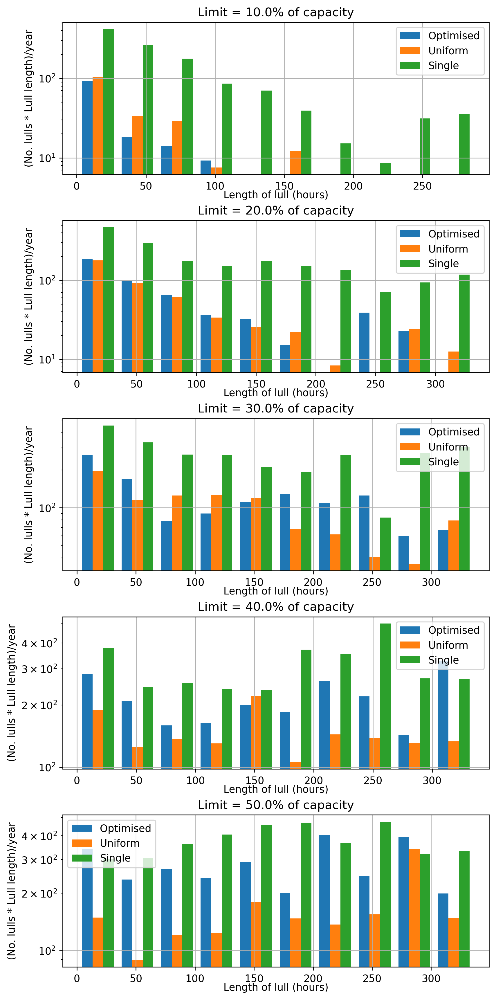

In [173]:
fig, ax = plt.subplots(5,dpi=250, figsize=(7,14))
fig.tight_layout(pad=2.5)
#plt.title(f'No. of lulls over lull duration (cut-off = {cut_offs*100}% of max power)')
for k in range(cut_offs.shape[0]):
    ax[k].set_xlabel('Length of lull (hours)',labelpad=-1)
    ax[k].set_ylabel('(No. lulls * Lull length)/year')
    ax[k].grid()
    
    
    x = dict()
    
    for j, power_arr in enumerate(layouts):   #iterate through groups
        x[j] = np.empty(0,dtype='object')
        for i in range(avg_nums.shape[0]):  #iterate through lull length
            
            arr = np.ones(int(num_lulls[k,j,i]))*(i+1)
            x[j] = np.hstack((x[j],arr))
    ax[k].hist([x[0],x[1],x[2]],weights=[x[0]/num_yrs,x[1]/num_yrs,x[2]/num_yrs], label = ['Optimised','Uniform','Single'])
    ax[k].set_title(f'Limit = {cut_offs[k]*100}% of capacity')
    ax[k].set_yscale('log')
    ax[k].legend()
fig.savefig('./figures/final_results_lull_frequency.pdf',bbox_inches='tight')

## Energy Gap Histogram

A scale factor is applied to this graph, taking the total wind power capacity from 222.75GW to 111.4GW, which is just above the offshore wind capacity that is stated to be required by 2050 (ref CCC).

If each grid point has a capacity of 2.23GW, this means for 111.4GW capacity, need 50 grid point wind farms across the U.K.

Therefore this result is also relativley physically feasible with very few adjustements for spacing to be considered from current locations.



In [171]:
start_date = '1998-01-01' #1998-01-01
end_date = '2021-12-31' #2021-12-31
num_yrs = 24 #years
grid_min_limits = np.array([0.1,0.2,0.3,0.4,0.5])
store = dict()
store_hours = dict()
storage_limit = 50 #GWh
hours_yr = 365.25*24
num_groups = len(layouts)
unavailable_prop = np.zeros((grid_min_limits.shape[0],num_groups))
store_above_limit = dict()

#scale factor - taking from equivalent of 100 wind farms to 10 wind farms capacity across the UK
decrease_factor = 0.5
agg_power_opt_small = agg_power_opt * decrease_factor
agg_power_uni_small = agg_power_uni * decrease_factor
agg_power_single_small = agg_power_single * decrease_factor


#cycle through cutoffs
for k in range(grid_min_limits.shape[0]):
    start = time.time()
    lull_limit = turbine_rating*1000*grid_min_limits[k]*n_turbs_grdpnt*num_farms*decrease_factor #max power to be considered a lull
    #cycle through different wind farm groups
    for j, power_arr in enumerate(layouts):
        power_arr_adj = power_arr*decrease_factor
        store[k,j] = []
        store_hours[k,j] = []
        working_ds = power_arr_adj.sel(time=slice(start_date, end_date)).copy()
        working_ds -= lull_limit
        working_ds = working_ds.where(working_ds < 0,0)
        working_ds = working_ds.values
        count = 0 
        num_hours = 0
        
        #sums the groups
        for i in working_ds:
            if i.item() == 0:
                if count != 0:
                    store[k,j].append(count)
                    store_hours[k,j].append(num_hours)
                    count = 0
                    num_hours = 0
            else:
                count += i.item()
                num_hours += 1
        if count != 0:
            store[k,j].append(count)
            store_hours[k,j].append(num_hours)
            
        store[k,j] = np.abs(np.array(store[k,j]))/1e6 #abs val and changing units
        store_hours[k,j] = np.sum(np.where(store[k,j] >= storage_limit,store_hours[k,j],0))
        unavailable_prop[k,j] = store_hours[k,j]/(hours_yr*num_yrs)
    end = time.time()
    print('Cut-off variation',k,', Time taken:',np.round(end-start,decimals=3),'secs \n')
    
print('Unavailable proportion:',np.round(unavailable_prop[0,0],decimals=5),
      np.round(unavailable_prop[1,0],decimals=5),np.round(unavailable_prop[2,0],decimals=5))

Cut-off variation 0 , Time taken: 0.333 secs 

Cut-off variation 1 , Time taken: 0.364 secs 

Cut-off variation 2 , Time taken: 0.385 secs 

Cut-off variation 3 , Time taken: 0.413 secs 

Cut-off variation 4 , Time taken: 0.439 secs 

Unavailable proportion: 0.01255 0.06755 0.14711


/home/xzcaphbe/.conda/envs/env3.8_optimise/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3245: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/home/xzcaphbe/.conda/envs/env3.8_optimise/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


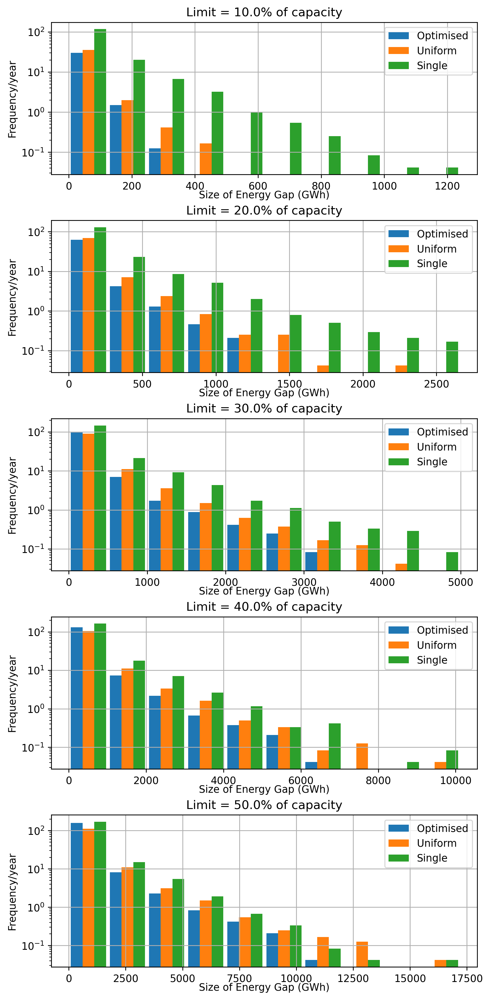

In [172]:
color = ['r','b','g','m']
fig, ax = plt.subplots(grid_min_limits.shape[0],dpi=250, figsize=(7,14*(grid_min_limits.shape[0]/5)))
fig.tight_layout(pad=2.5)
for k in range(grid_min_limits.shape[0]):
    ax[k].set_xlabel('Size of Energy Gap (GWh)',labelpad=-1)
    ax[k].set_ylabel('Frequency/year')
    ax[k].grid()        
    ax[k].hist([store[k,0],store[k,1],store[k,2]],label = ['Optimised','Uniform','Single'],rwidth=0.9,
              weights=[np.ones(store[k,0].shape[0])/num_yrs, np.ones(store[k,1].shape[0])/num_yrs, 
               np.ones(store[k,2].shape[0])/num_yrs])
    ax[k].set_yscale('log')
    ax[k].set_title(f'Limit = {grid_min_limits[k]*100}% of capacity')
    ax[k].legend()
fig.savefig('./figures/final_results_hist_energy_gap.pdf',bbox_inches='tight')

## Plotting other analyses that were optimised for

### Aggregate Firm Capacity

In [175]:
#calculating firm capacity
N = 10000 #number of samples
ratios = np.linspace(0,1.0,N)
#ratios = np.array([0.3,0.4,0.5]) #delete this later
num_theoretical_farms = 100
power_limit = ratios * 8000 * n_turbs_grdpnt * num_theoretical_farms
firm_capacity = np.empty((num_groups,ratios.shape[0]))


agg_power = layouts

arr_length = agg_power[0].shape[0]

for j in range(num_groups):
    start= time.time()
    for i, ratio in enumerate(ratios):
        working_ds = agg_power[j]
        val = working_ds.where(working_ds>=power_limit[i]).count(dim='time').values
        firm_capacity[j,i] = val/arr_length #proportion of values above the power limit
    end = time.time()
    print(j,') Time taken for',ratios.shape[0],'calculations:',np.round((end-start),decimals=2),'secs')
    #print(firm_capacity[j,:])
    


0 ) Time taken for 10000 calculations: 16.14 secs
1 ) Time taken for 10000 calculations: 15.79 secs
2 ) Time taken for 10000 calculations: 16.52 secs


71.5 % of the time, the optimised group provides at least 40.0 % of capacity
65.28 % of the time, the uniform group provides at least 40.0 % of capacity
7.31994828504069


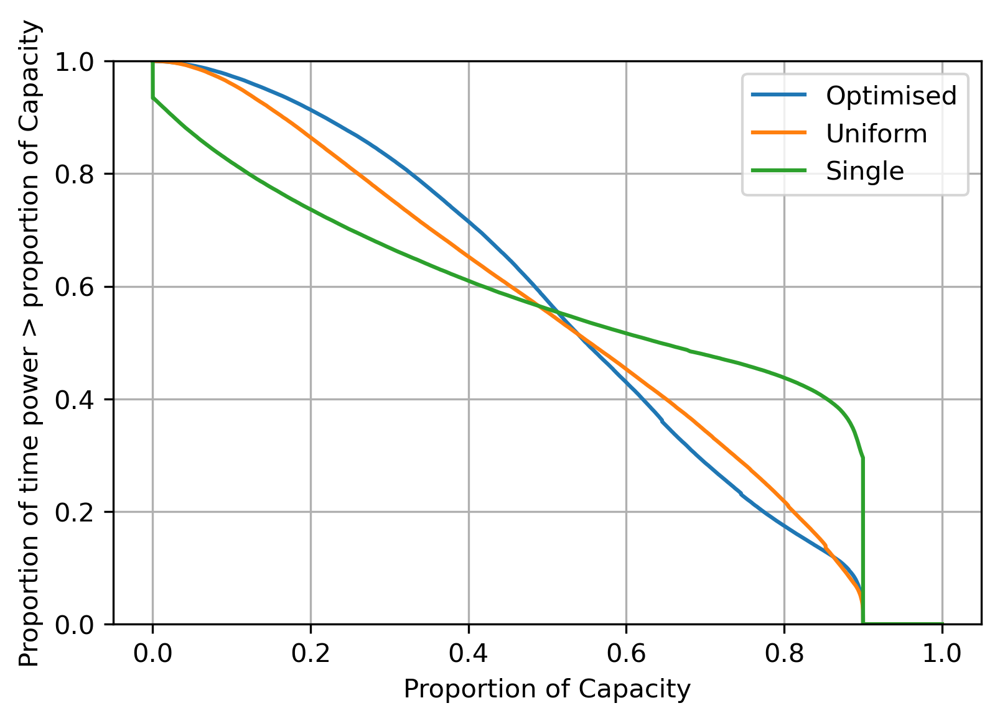

In [203]:
scale = 1e-6 #converts kW to GW
plt.figure(dpi=300)
for j in range(num_groups):
    plt.plot(ratios, firm_capacity[j,:],label=['Optimised','Uniform','Single'][j])
plt.ylim(0,1)
#plt.axvline(x= 1, color='red',linestyle='--',linewidth=0.4)
plt.title('Firm Capacity over a range')
plt.title('')
plt.xlabel('Proportion of Capacity')
plt.ylabel('Proportion of time power > proportion of Capacity')
plt.legend()
plt.grid()

plt.savefig('./figures/firm_capacity_range_optimised.pdf',bbox_inches='tight')

i = int(0.4*10000)
print(np.round(firm_capacity[0,i]*100,decimals=2),'% of the time, the optimised group provides at least',
      np.round(ratios[i]*100,decimals=2),'% of capacity')

print(np.round(firm_capacity[1,i]*100,decimals=2),'% of the time, the uniform group provides at least',
      np.round(ratios[i]*100,decimals=2),'% of capacity')

print(np.max(firm_capacity[0,:] - firm_capacity[1,:])*100)